# FDA MAUDE Preliminary Analysis

This is a large corpus on medical device reports from the Food and Drug Administration (FDA) is the [Manufacturer and User Facility Device Experience Database (MAUDE)](https://www.fda.gov/medical-devices/mandatory-reporting-requirements-manufacturers-importers-and-device-user-facilities/manufacturer-and-user-facility-device-experience-database-maude). The file `FDA MAUDE Primer.pdf` may help in understanding this data.


In [11]:
"""
Preamble for most code and jupyter notebooks
@author: tobinsouth
@notebook date: 19 Mar 2021
"""

import numpy as np, pandas as pd

import matplotlib.pyplot as plt, seaborn as sns
import matplotlib as mpl

import math, string, re, pickle, json, time, os, sys, datetime, itertools

from tqdm.notebook import tqdm # This makes progress bars

# Data

In [18]:
!pip3.9 install iprogress

### Load in device data

In [19]:
device_files = pd.DataFrame()
local = False

import warnings
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=pd.errors.DtypeWarning)
    for year in tqdm(range(2000, 2021)):
        if local:
            device_file = pd.read_csv('data/MAUDE_data/device%d.zip' % year)
        else:
            device_file = pd.read_csv('https://www.accessdata.fda.gov/MAUDE/ftparea/device%d.zip' % year, sep='|', quoting=3, encoding = "ISO-8859-1")
            device_file.to_csv('data/MAUDE_data/device%d.zip' % year, index = False)
        device_files = device_files.append(device_file)

ImportError: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html

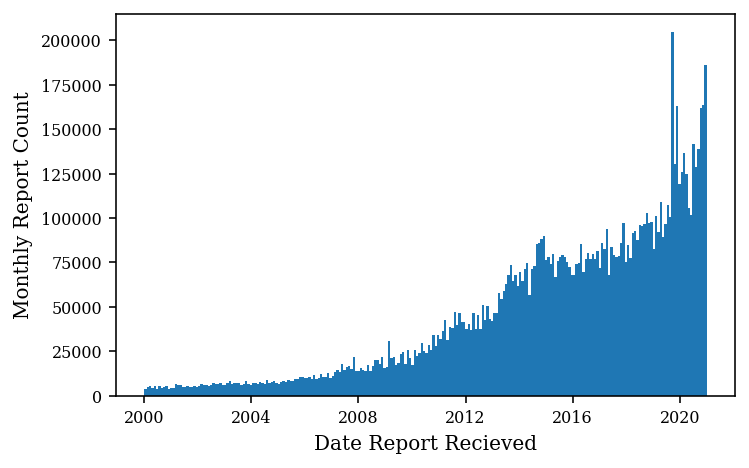

In [9]:
date_received = pd.to_datetime(device_files['DATE_RECEIVED'], errors='coerce')
plt.hist(date_received, bins = 12*20)
plt.xlabel('Date Report Recieved')
plt.ylabel('Monthly Report Count')
plt.tight_layout()
plt.savefig('figs/FDA_report_counts.png', dpi = 300)

### Load in text report data

In [10]:
import urllib.request, os.path
base = 'https://www.accessdata.fda.gov/MAUDE/ftparea/'

for year in tqdm([2020]):
    name = 'foitext%d.zip'% year
    if not os.path.exists('data/'+name):
        urllib.request.urlretrieve(base+name, 'data/'+name)
        print('Downloading ', name)
    foitext_file = pd.read_csv('data/'+name, sep='|', quoting=3, encoding = "ISO-8859-1")

  0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
foitext_file = foitext_file.set_index('MDR_TEXT_KEY') # Set text report key as index
foitext = foitext_file['FOI_TEXT'] # Get text column

## Matching reports.

Each text report in foitext_file has a unique MDR_TEXT_KEY. Each report has a MDR_REPORT_KEY which may have mutliple MDR_TEXT_KEYs. Pay careful attention to the different TEXT_TYPE_CODE types and see either the FDA website witht the data for explaination.

You can match device records to text records as follows.

In [49]:
device_files = device_files[device_files['MDR_REPORT_KEY'].apply(type) == int] # Get only reports with an int key value
device_files = device_files.set_index('MDR_REPORT_KEY')
foitext_file = foitext_file.join(device_files, on = 'MDR_REPORT_KEY', how = 'left', rsuffix='_device')

## Tokenizing

A major challenge with the FDA is the large variety of ways that the text is entered. Some reports are simple text written by a human, some are laced with medical terms and written by a doctor/manufacturer, others still are comma-separated excel files that someone has copied and pasted into the text field. I would recommend careful thought is put into the tokenizing. Example a shown below.

In [21]:
foitext.loc[173269159] # Manufacturer written example

'THE RESULTS OF THE INVESTIGATION ARE INCONCLUSIVE SINCE THE DEVICE WAS NOT RETURNED FOR ANALYSIS. BASED ON THE INFORMATION RECEIVED, THE CAUSE OF THE REPORTED INCIDENT COULD NOT BE CONCLUSIVELY DETERMINED. FURTHER INFORMATION WAS REQUESTED BUT NOT RECEIVED.'

In [18]:
foitext.loc[700809694][:200] # CSV style example

'Unique Complaint ID Number,Initial or Supplement,Type of event,TTE in days,Device Brand Name,Medical device identifier,Device Codes;703510725-1266025-20,I,SI,0,Evolut PRO System,29mm TAV EvolutPRO-29-'

In [46]:
from nltk.tokenize import RegexpTokenizer
tokenizer = RegexpTokenizer('[A-Za-z]+') # Checks that word has a valid start, also returns start
def clean_text(text):
    if type(text) != str:
        return None
    
    tokens = tokenizer.tokenize(text)
        
    # This removes words that a ridiculously long, just a number of have only 1 character.
    tokens = [token.lower() for token in tokens 
              if (len(token) < 100) and (not token.isnumeric()) and (len(token) > 1)]  

    if len(tokens) == 0: # Catch empty strings
        return None

    return tokens # For some reason everything is much faster if I store it in a single string rather than a list of tokens


## Preliminary Steps

In [47]:
# Create total dictionary
from collections import Counter
word_counts = Counter()
for text in tqdm(foitext):
    cleaned_text = clean_text(text)
    if text: # Check if empty
        word_counts.update(Counter(cleaned_text))

  0%|          | 0/3022877 [00:00<?, ?it/s]

## Word Cloud


In [13]:
from wordcloud import WordCloud

stopwords = WordCloud().stopwords
wordcloud = WordCloud(width=1600, height=993, background_color='white').fit_words({w:c for w,c in word_counts.items() if w not in stopwords})

  0%|          | 0/3002144 [00:00<?, ?it/s]

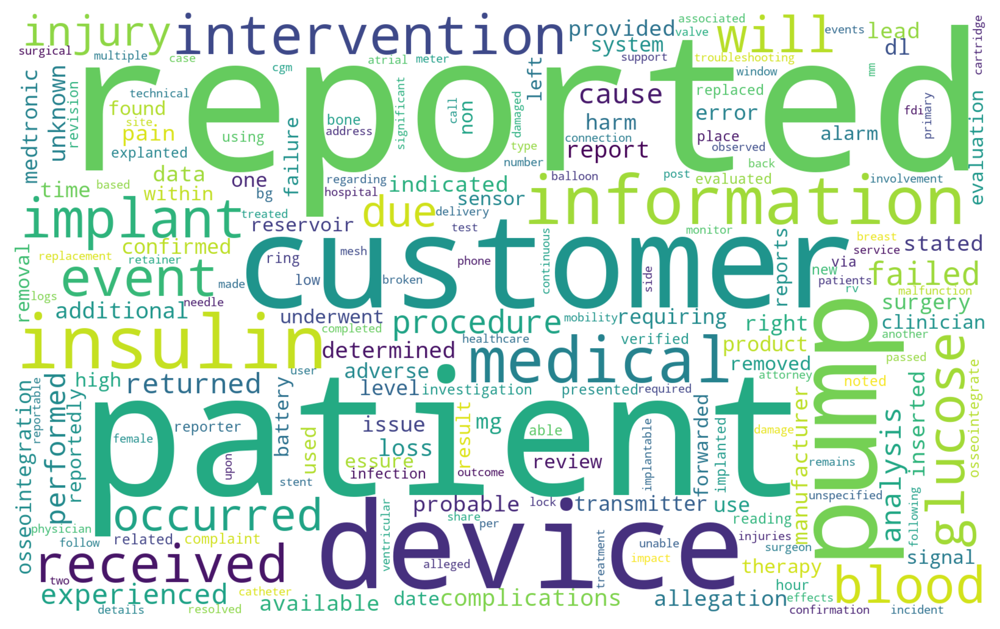

In [ ]:
plt.figure(figsize = (8, 4.96), facecolor = None, dpi=500)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

# LDA

As an example of what we can do here, I'll show the simple use of LDA in python to show clusters. This doesn't work brilliantly for this data set, but it is a good start. Perhaps more manufacturer filtering is needed.

In [50]:
# Creating word mappings to int for speed efficency.
wordToMapping = {}
mappingToWord = {}
for i, (word, count) in enumerate(word_counts.most_common()):
    if count > 15:
        wordToMapping[word] = i
        mappingToWord[i] = word

In [51]:
def toBow(text):
    cleaned_text = clean_text(text)
    if cleaned_text:
        mappedWords = [wordToMapping.get(w, -400) for w in cleaned_text]
        bow = list(Counter(mappedWords).items())
        if len(bow)>0:
            return bow


bowDocs = [toBow(t) for t in tqdm(foitext)]
bowDocs_index = [i for i,b in enumerate(bowDocs) if b]
bowDocs = [b for b in bowDocs if b]

  0%|          | 0/3022877 [00:00<?, ?it/s]

In [53]:
# from gensim import models
# lda_model = models.LdaMulticore(bowDocs, num_topics=80, passes=1, workers=1, id2word=mappingToWord)

In [ ]:
# import pyLDAvis # https://pyldavis.readthedocs.io
# pyLDAvis.enable_notebook()

# import pyLDAvis.gensim_models as gensimvis 
# pyLDAvis.gensimvis.prepare(lda_model, bowDocs, mappingToWord)

# Future Work:

There is plenty more to be done here. Previously I applied the techniques shown in TGA-DAEN to this data and it performed slightly worse. I've removed these for clarity. This dataset has much more text and lends itself to larger-scale approaches to analysing text.